In [3]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 28kB/s 
     |████████████████████████████████| 6.6MB 45.1MB/s 
  Found existing installation: torch 1.5.1+cu101
    Uninstalling torch-1.5.1+cu101:
      Successfully uninstalled torch-1.5.1+cu101
  Found existing installation: torchvision 0.6.1+cu101
    Uninstalling torchvision-0.6.1+cu101:
      Successfully uninstalled torchvision-0.6.1+cu101
     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=91d60c24e7b843eeec70a1b1848ec83b0c122be709d5e18ef0c9f831dfa33b55
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

In [4]:
# mount your gdrive folder
from google.colab import drive
drive.mount('/content/drive')



Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [5]:
%cd /content/drive/My Drive/ML


/content/drive/My Drive/ML


In [6]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 766kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200711-cp36-none-any.whl size=42285 sha256=346d80f2b02cda506ca70b4d9a89ea04578765ff0c1477a3de4534f1db858a62
  Stored in directory: /root/.cache/pip/wheels/be/e2/ff/183aa84c45c7f0a6f55d2a40bdbfc00e9d5c36b492065ec526
Successfully built fvcore


In [7]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger

import detectron2
from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog


In [8]:

# Register a dataset in COCO’s json annotation format for instance detection, instance segmentation and keypoint detection. 
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/My Drive/ML/all_May_2020/train/train_coco.json", "/content/drive/My Drive/ML/all_May_2020/train/images")
register_coco_instances("my_dataset_val", {}, "/content/drive/My Drive/ML/all_May_2020/val/val_coco.json", "/content/drive/My Drive/ML/all_May_2020/val/images")


In [9]:
from detectron2.data import DatasetCatalog, MetadataCatalog

papers_metadata = MetadataCatalog.get("my_dataset_train") #return the Metadata instance associated with this name
dataset_dicts = DatasetCatalog.get("my_dataset_train") # Call the registered function and return dataset annotations


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



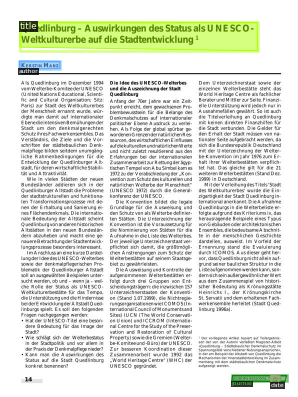

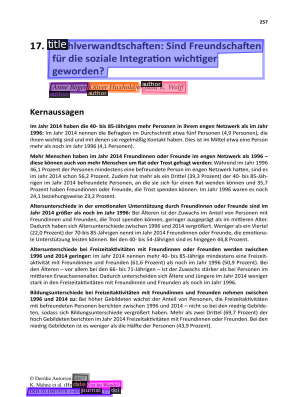

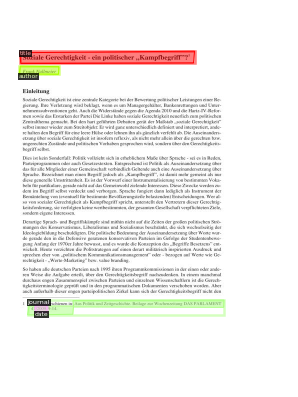

In [10]:
# take a look at the data to see if the images are loaded correctly
from google.colab.patches import cv2_imshow
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=papers_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [11]:
import os
import datetime
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# create the output dir for the trained model
output_dir = os.path.join("/content/drive/My Drive/ML/output", datetime.datetime.now().strftime('%Y%m%dT%H%M'))
os.makedirs(output_dir, exist_ok=True)
# change the config in the .yaml document
cfg = cfg = get_cfg() #load default config
cfg.merge_from_file("/content/drive/My Drive/ML/detectron2/configs/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.OUTPUT_DIR = output_dir #change the output path
cfg.DATASETS.TRAIN = ("my_dataset_train",) #specify the trainning dataset
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "/content/drive/My Drive/ML/model_final_trimmed.pth"  # load intial weights from the pre-trained model in publaynet
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.PANOPTIC_FPN.COMBINE.INSTANCES_CONFIDENCE_THRESH = 0.5
cfg.SOLVER.IMS_PER_BATCH = 2
# cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9 
cfg.MODEL.BACKBONE.FREEZE_AT= 3 #freeze the stem and 2 backbone layers
#serialize the training config
cfg_str = cfg.dump()
with open(os.path.join(cfg.OUTPUT_DIR, "train_config.yaml"), "w") as f:  #write the new config in the 'train_config.yaml'
  f.write(cfg_str)
f.close()

# using hpanwar08's trainer specified in the cell above
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()



Config '/content/drive/My Drive/ML/detectron2/configs/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


[07/14 08:46:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (6, 1024) in the checkpoint but (10, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (6,) in the checkpoint but (10,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (20, 1024) in the checkpoint but (36, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (20,) in the checkpoint but (36,) in the model!
Unable to load 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (5, 256, 1, 1) in the checkpoint but (9, 256, 1, 1) in the model!
Unable to load 'roi_heads.mask_head.predictor.bias' to the model due to incompatible shapes: (5,) in the checkpoint but (9,) in the model!


[07/14 08:46:23 d2.engine.train_loop]: Starting training from iteration 0
[07/14 08:47:25 d2.utils.events]:  eta: 4:15:34  iter: 19  total_loss: 3.578  loss_cls: 2.220  loss_box_reg: 0.156  loss_mask: 0.696  loss_rpn_cls: 0.129  loss_rpn_loc: 0.283  time: 3.0526  data_time: 0.0499  lr: 0.000018  max_mem: 4555M
[07/14 08:48:28 d2.utils.events]:  eta: 4:16:19  iter: 39  total_loss: 3.076  loss_cls: 1.882  loss_box_reg: 0.129  loss_mask: 0.688  loss_rpn_cls: 0.200  loss_rpn_loc: 0.162  time: 3.0844  data_time: 0.0062  lr: 0.000036  max_mem: 4555M
[07/14 08:49:27 d2.utils.events]:  eta: 4:12:00  iter: 59  total_loss: 2.310  loss_cls: 1.161  loss_box_reg: 0.173  loss_mask: 0.668  loss_rpn_cls: 0.098  loss_rpn_loc: 0.143  time: 3.0424  data_time: 0.0066  lr: 0.000054  max_mem: 4555M
[07/14 08:50:29 d2.utils.events]:  eta: 4:11:32  iter: 79  total_loss: 1.792  loss_cls: 0.632  loss_box_reg: 0.174  loss_mask: 0.638  loss_rpn_cls: 0.077  loss_rpn_loc: 0.163  time: 3.0564  data_time: 0.0067  lr:

In [14]:
print(output_dir)

/content/drive/My Drive/ML/output/20200714T0846


In [15]:
# Look at training curves in tensorboard:

%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [17]:
import os
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_val", )
predictor = DefaultPredictor(cfg)

[07/14 13:12:15 d2.data.datasets.coco]: Loading /content/drive/My Drive/ML/all_May_2020/val/val_coco.json takes 1.26 seconds.
WARNING [07/14 13:12:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/14 13:12:15 d2.data.datasets.coco]: Loaded 17 images in COCO format from /content/drive/My Drive/ML/all_May_2020/val/val_coco.json


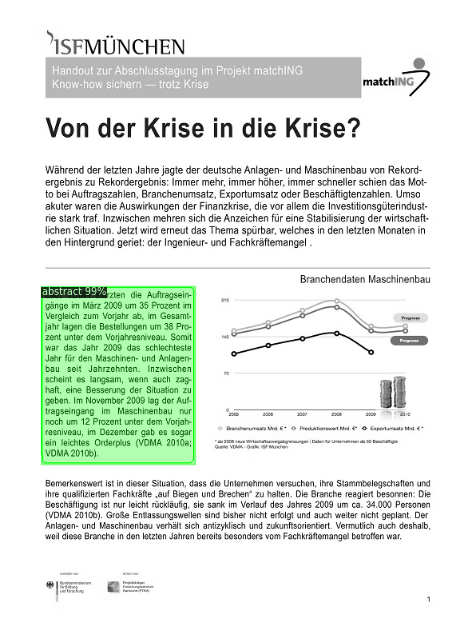

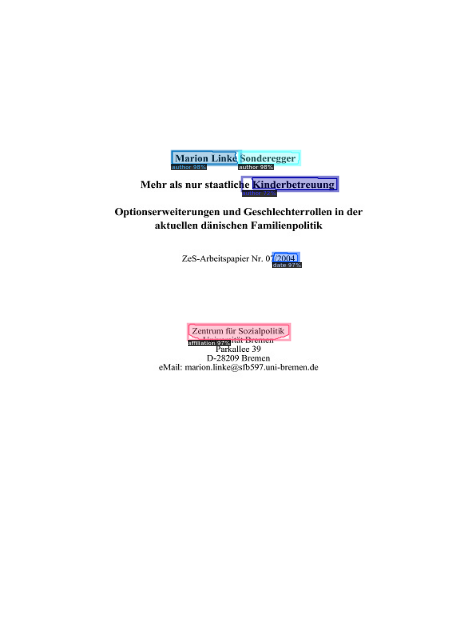

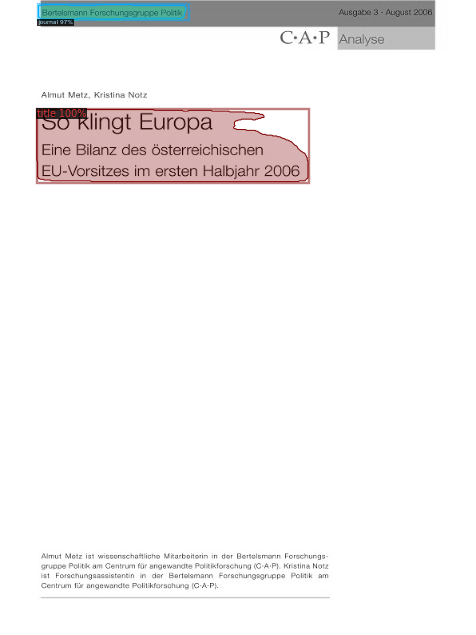

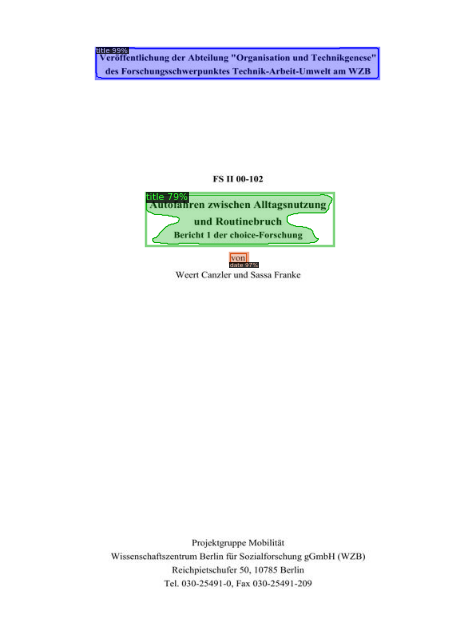

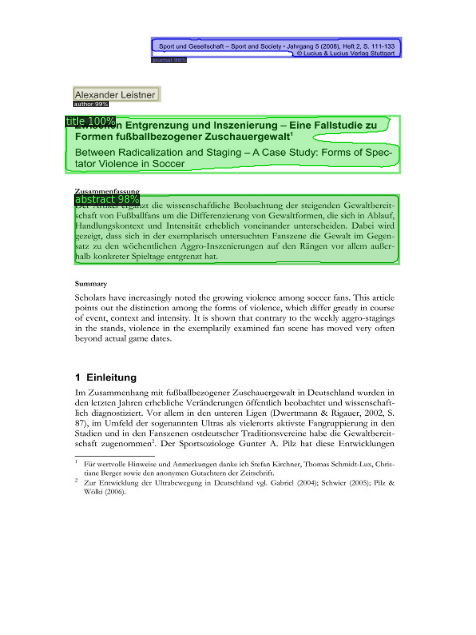

...

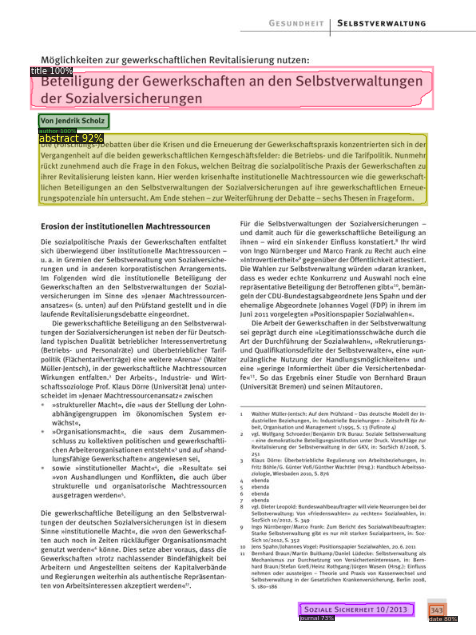

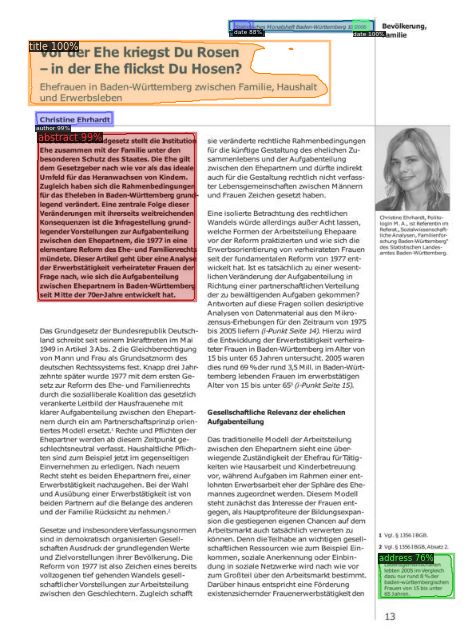

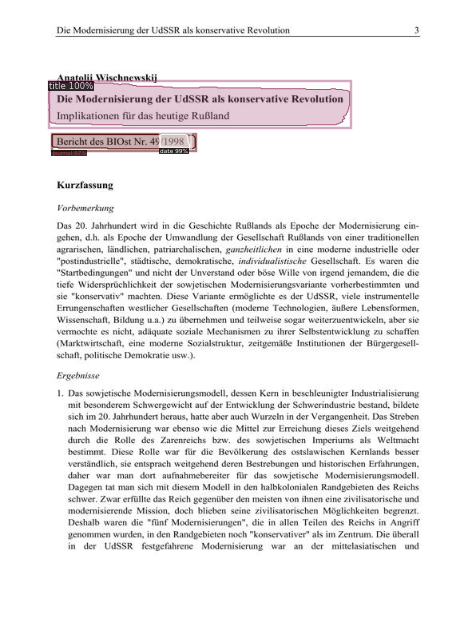

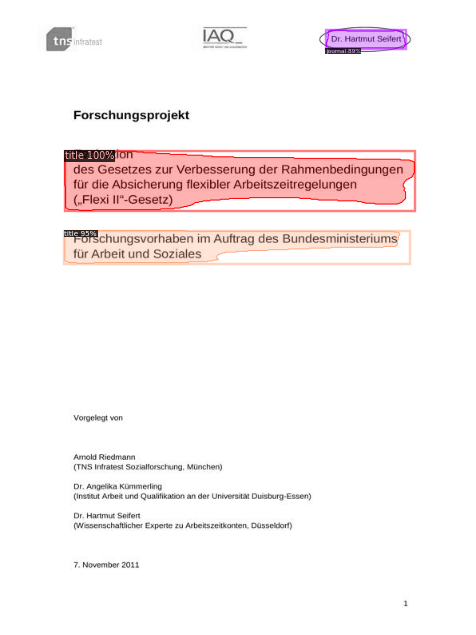

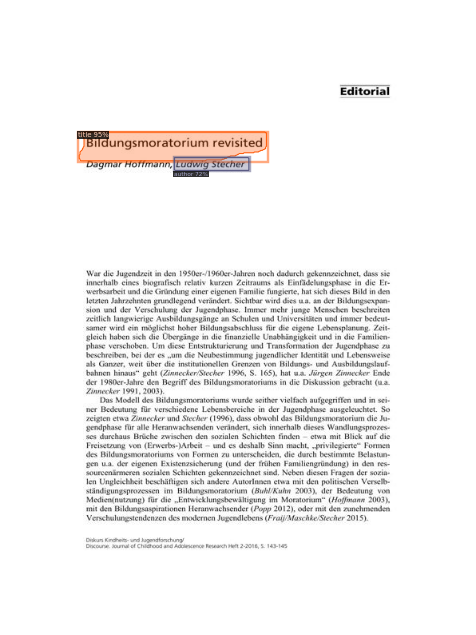

In [18]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts_val = DatasetCatalog.get("my_dataset_val")
for d in dataset_dicts_val:    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=papers_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/14 13:13:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/14 13:13:39 d2.data.datasets.coco]: Loaded 17 images in COCO format from /content/drive/My Drive/ML/all_May_2020/val/val_coco.json
[07/14 13:13:39 d2.data.common]: Serializing 17 elements to byte tensors and concatenating them all ...
[07/14 13:13:39 d2.data.common]: Serialized dataset takes 0.02 MiB
[07/14 13:13:39 d2.evaluation.evaluator]: Start inference on 17 images
[07/14 13:13:47 d2.evaluation.evaluator]: Inference done 11/17. 0.7118 s / img. ETA=0:00:04
[07/14 13:13:51 d2.evaluation.evaluator]: Total inference time: 0:00:08.637243 (0.719770 s / img per device, on 1 devices)
[07/14 13:13:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:08 (0.706180 s / img per device, on 1 devices)
[07/14 13:13:52 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/14 13:13:52 d2.evaluation.coco_evaluation]: Saving 

OrderedDict([('bbox',
              {'AP': 21.3511033610912,
               'AP-abstract': 68.4070407040704,
               'AP-address': 11.584158415841586,
               'AP-affiliation': 6.435643564356433,
               'AP-author': 31.51682802751068,
               'AP-date': 6.9306930693069315,
               'AP-doi': 0.0,
               'AP-email': 0.0,
               'AP-journal': 15.405490549054903,
               'AP-title': 51.88007591967987,
               'AP50': 33.05988980428793,
               'AP75': 22.271394030991043,
               'APl': 41.28641545473229,
               'APm': 19.237397249209685,
               'APs': 6.50990099009901}),
             ('segm',
              {'AP': 20.40721798145369,
               'AP-abstract': 70.87568756875687,
               'AP-address': 7.7227722772277225,
               'AP-affiliation': 6.435643564356433,
               'AP-author': 31.939368257242158,
               'AP-date': 7.7227722772277225,
               'AP-doi':

In [22]:
#register the test dataset
register_coco_instances("my_dataset_test", {}, "/content/drive/My Drive/ML/all_May_2020/test/test_coco.json", "/content/drive/My Drive/ML/all_May_2020/test/images")

AssertionError: ignored

[07/14 13:15:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

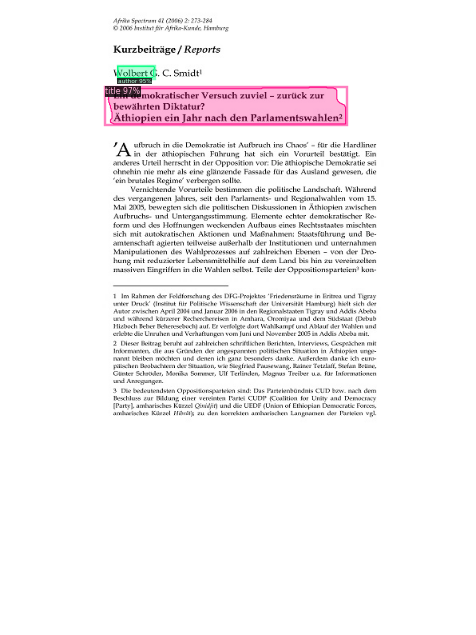

/content/drive/My Drive/ML/all_May_2020/test/images/11164


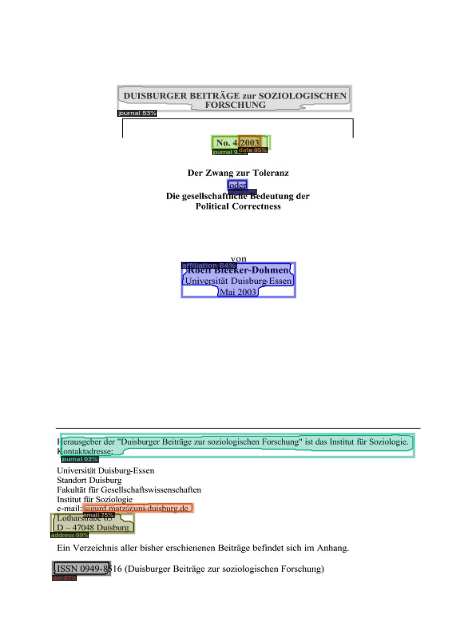

/content/drive/My Drive/ML/all_May_2020/test/images/11190


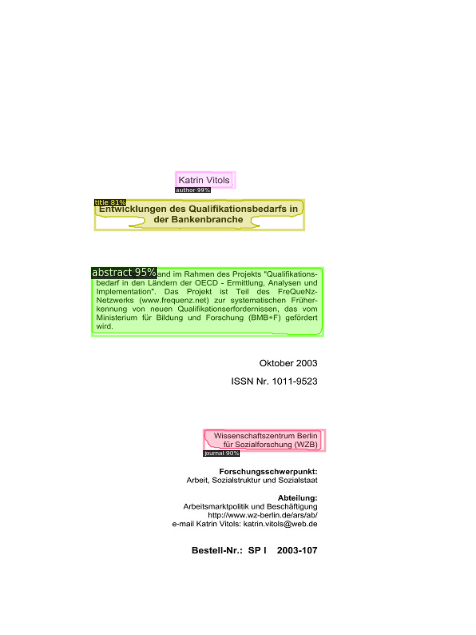

/content/drive/My Drive/ML/all_May_2020/test/images/11448


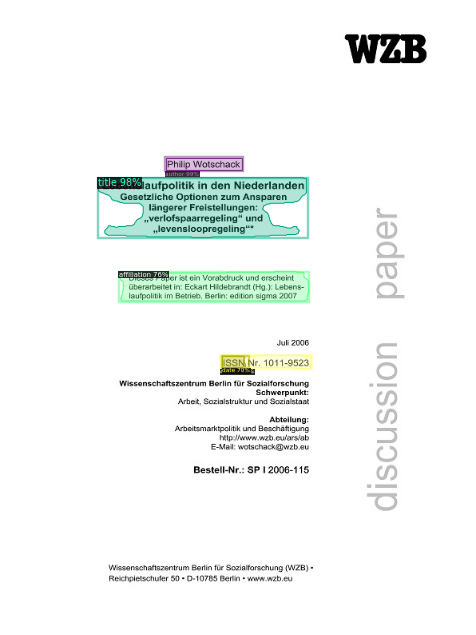

/content/drive/My Drive/ML/all_May_2020/test/images/12797


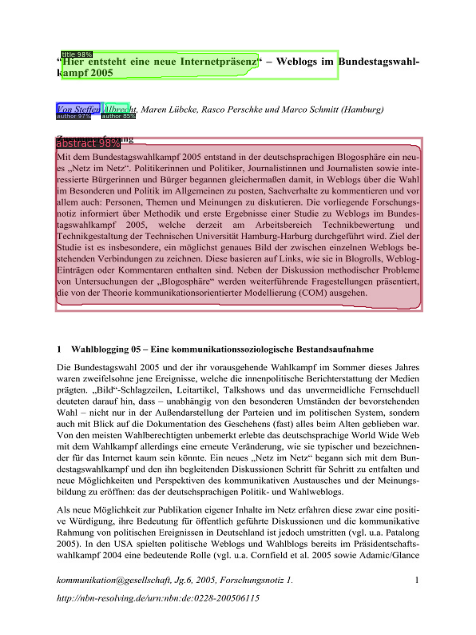

/content/drive/My Drive/ML/all_May_2020/test/images/17492


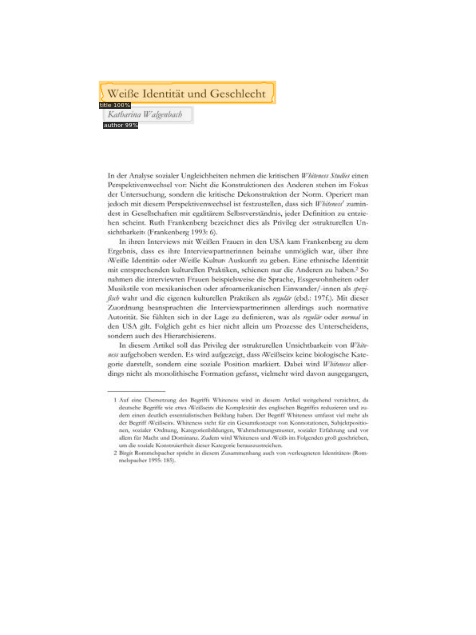

/content/drive/My Drive/ML/all_May_2020/test/images/19396


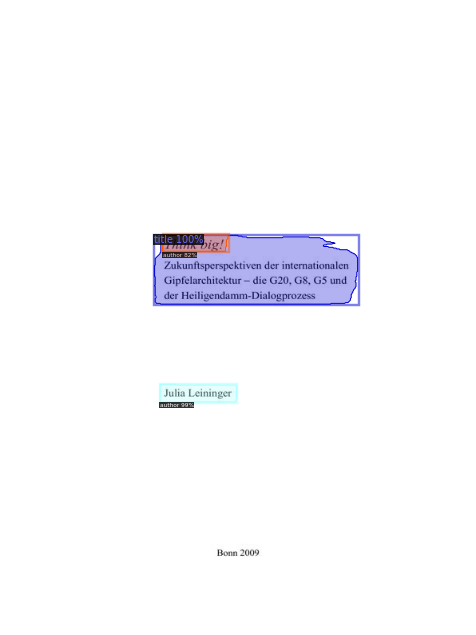

/content/drive/My Drive/ML/all_May_2020/test/images/22006


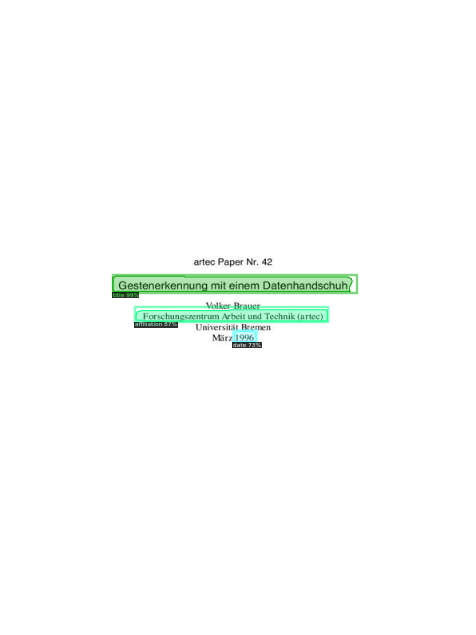

/content/drive/My Drive/ML/all_May_2020/test/images/31474


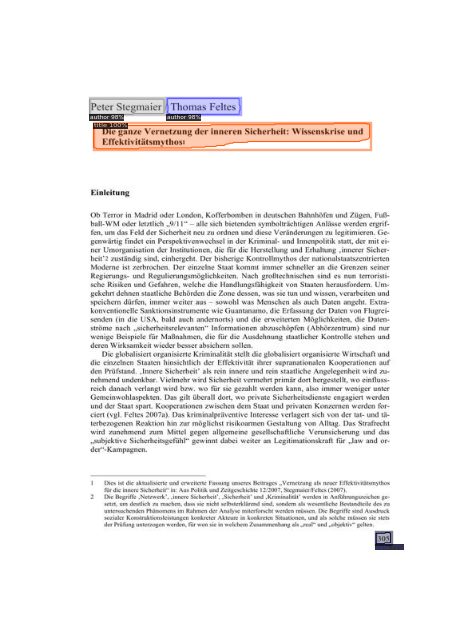

In [24]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

from detectron2.utils.visualizer import ColorMode
dataset_dicts_test = DatasetCatalog.get("my_dataset_test")
for d in dataset_dicts_test:    
    im = cv2.imread(d["file_name"])
    print(d["file_name"][:-5])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=papers_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2.imwrite(d["file_name"][:-5] + "_test.png", v.get_image()[:, :, ::-1])
    cv2_imshow(v.get_image()[:, :, ::-1])

In [25]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir=output_dir)
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [07/14 13:25:53 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/14 13:25:53 d2.data.datasets.coco]: Loaded 9 images in COCO format from /content/drive/My Drive/ML/all_May_2020/test/test_coco.json
[07/14 13:25:53 d2.data.build]: Distribution of instances among all 9 categories:
|  category  | #instances   |  category  | #instances   |  category   | #instances   |
|:----------:|:-------------|:----------:|:-------------|:-----------:|:-------------|
|  abstract  | 1            |  address   | 3            | affiliation | 7            |
|   author   | 13           |    date    | 8            |     doi     | 6            |
|   email    | 2            |  journal   | 3            |    title    | 9            |
|            |              |            |              |             |              |
|   total    | 52           |            |              |             |              |
[07/14 13:25:53 d2.data.common]: Se

OrderedDict([('bbox',
              {'AP': 20.50821153543926,
               'AP-abstract': 80.0,
               'AP-address': 0.0,
               'AP-affiliation': 1.4851485148514847,
               'AP-author': 24.026402640264024,
               'AP-date': 3.8613861386138613,
               'AP-doi': 10.099009900990097,
               'AP-email': 0.0,
               'AP-journal': 7.574257425742574,
               'AP-title': 57.52769919849128,
               'AP50': 31.24312431243124,
               'AP75': 23.72203887055372,
               'APl': 50.145214521452154,
               'APm': 11.844059405940593,
               'APs': 1.6831683168316833}),
             ('segm',
              {'AP': 20.517261249934517,
               'AP-abstract': 89.99999999999999,
               'AP-address': 0.0,
               'AP-affiliation': 1.4851485148514847,
               'AP-author': 26.963696369636963,
               'AP-date': 4.5049504950495045,
               'AP-doi': 8.415841584158414,
 